In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pickle 
import glob
%matplotlib inline 

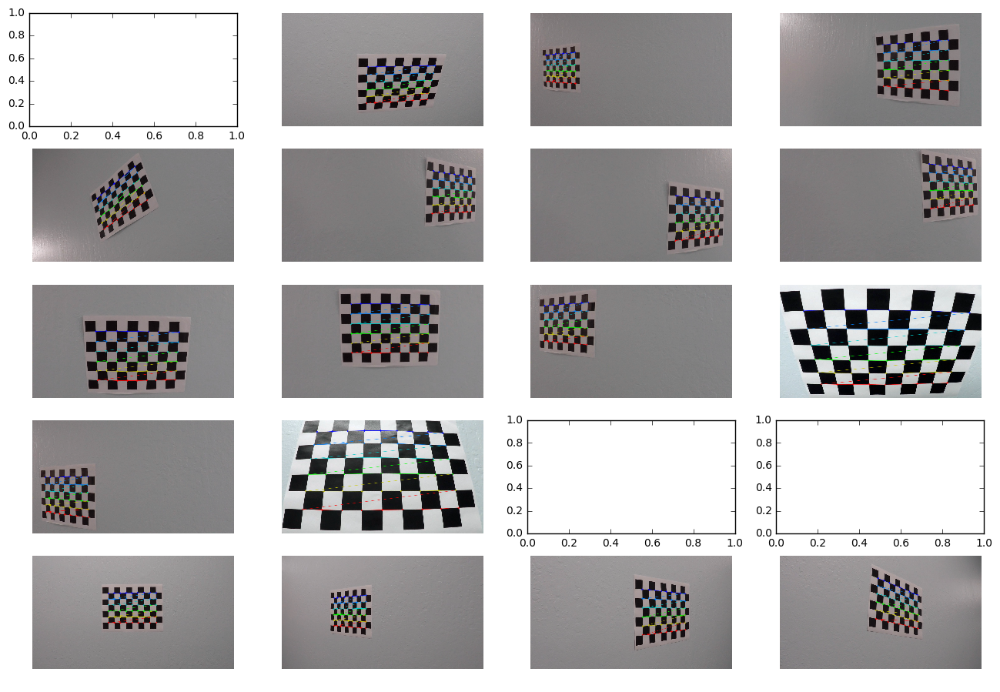

In [2]:
# Returning the list of images of the checkerboards 
img = glob.glob('./camera_cal/calibration*.jpg')

#Object Points for the calibration images
nx = 9
ny = 6
xz = 7
# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

objpoints = []
imgpoints = []

fig, axs = plt.subplots(5,4, figsize=(16, 11))
axs = axs.ravel()

#Visualizing the Images
for i, fname in enumerate(img):
    image = cv2.imread(fname)
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    if ret == True:
        #Loading the data, increasing accuracy cornerSubPix() according to openCV Turorials
        objpoints.append(objp)
        
        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)    
        
        #Showing the Boards
        cv2.drawChessboardCorners(image, (nx, ny), corners, ret)
        axs[i].axis('off')
        axs[i].imshow(image)

        
    
    

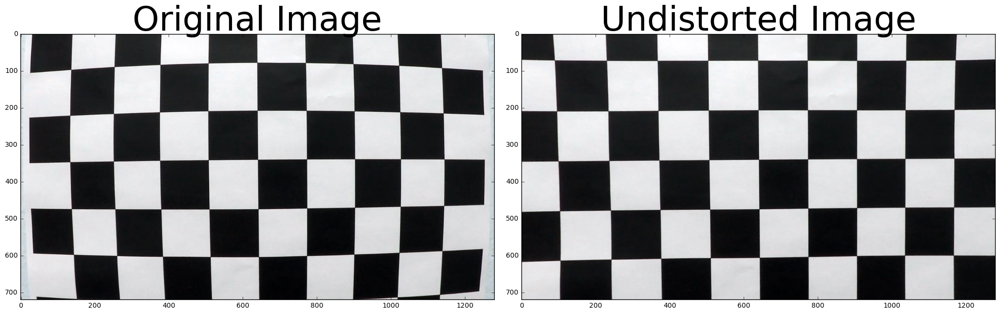

In [3]:
image = cv2.imread('./camera_cal/calibration1.jpg')
img_size = (gray.shape[1], gray.shape[0])


def undistorted(img, objpoints, imgpoints):  
    
    #Camera Calibration
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

    #Undistorting Image
    dst = cv2.undistort(img, mtx, dist, None, mtx)     
    
    return dst

result_image = undistorted(image, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(result_image)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    




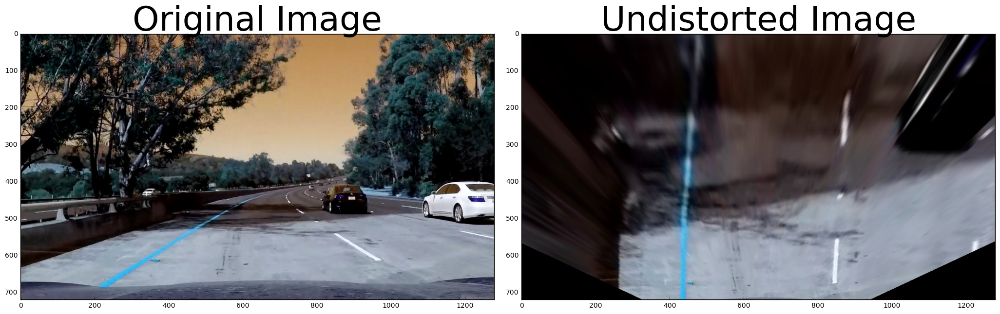

In [4]:
#Test Image for Perspective Transformation
test_image = cv2.imread('./test_images/test5.jpg')

def perspective(img):
    
    h,w = img.shape[:2]

    # define source and destination points for transform
    src = np.float32([(575,464),
                      (707,464), 
                      (258,682), 
                      (1049,682)])
    dst = np.float32([(450,0),
                      (w-450,0),
                      (450,h),
                      (w-450,h)])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)
    
    return warped, M

new_test_image = undistorted(test_image, objpoints, imgpoints)
new_test_image, M = perspective(new_test_image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(new_test_image)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


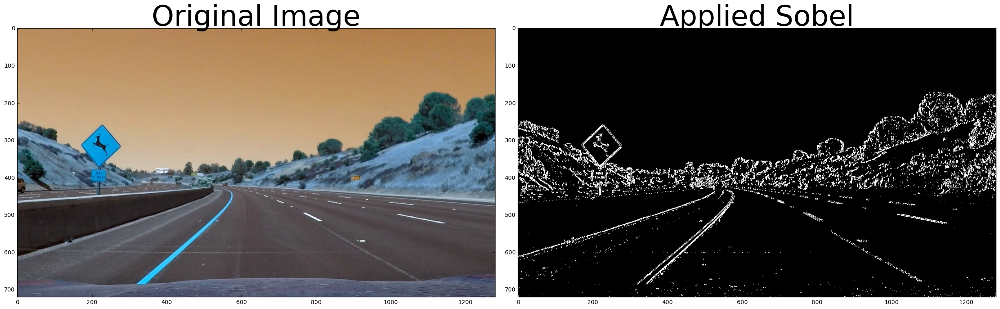

In [8]:
sobel_test_image = cv2.imread('./test_images/test2.jpg')

def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # 3) Take the absolute value of the derivative or gradient
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    binary_output = np.zeros_like(scaled_sobel)
    
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    return binary_output

mag_binary = abs_sobel_thresh(sobel_test_image, orient='x', thresh_min=20, thresh_max=100)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(sobel_test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Applied Sobel', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

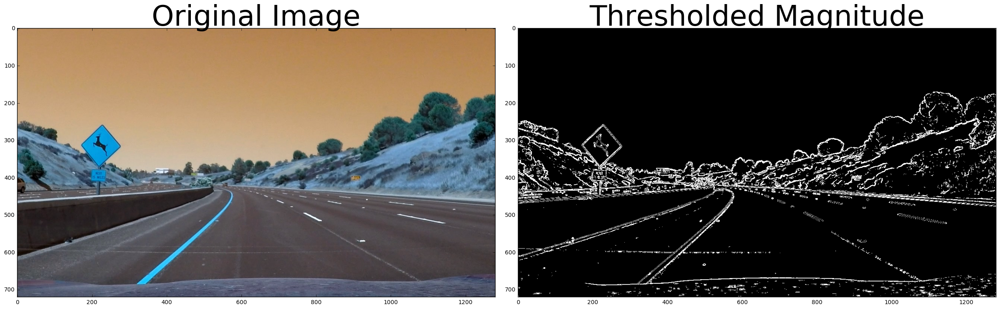

In [10]:
magnitude_test = cv2.imread('./test_images/test2.jpg')

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(gradmag)
    # 6) Return this mask as your binary_output image
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    
    return binary_output

mag_image = mag_thresh(magnitude_test, sobel_kernel=3, mag_thresh=(30, 100))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(magnitude_test)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_image, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    

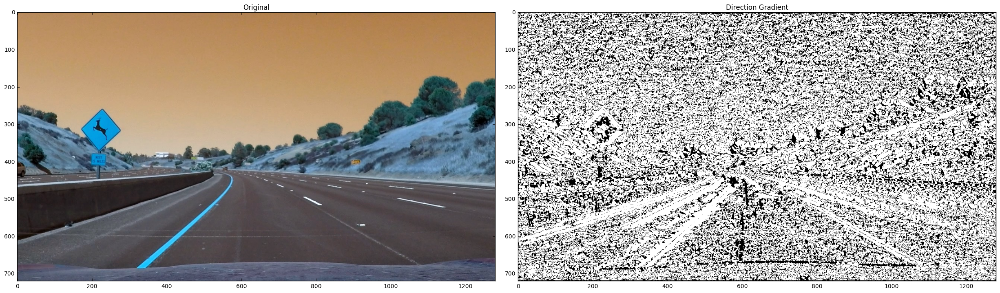

In [21]:
def dir_thresh(img, sobel_kernel = 3, thresh= (0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize= sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize= sobel_kernel)
    
    absgradient = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    
    binary_output = np.zeros_like(absgradient)
    binary_output[(absgradient >= thresh[0]) & (absgradient <= thresh[1])] = 1
    return binary_output

dir_image = dir_thresh(magnitude_test, sobel_kernel=15, thresh=(0.5, 1.5))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(magnitude_test)
ax1.set_title("Original")
ax2.imshow(dir_image, cmap='gray')
ax2.set_title("Direction Gradient")
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    

In [34]:
#Putting all the Gradients and the Sobel thresholds together

ksize = 3
def thresholds_add(image):
    
    gradx = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(image, orient='y', thresh_min=20, thresh_max=100)
    magnitude_bin = mag_thresh(image, sobel_kernel= 3, mag_thresh=(30, 100))
    direction_bin = dir_thresh(image, sobel_kernel=3, thresh=(0.5, 1.4))
    
    #Empty Array
    combined_thresholds = np.zeros_like(direction_bin)
    
    combined_thresholds[((gradx == 1) & (grady == 1)) | ((magnitude_bin == 1) & (direction_bin == 1))] = 1
    return combined_thresholds
    
# combined_image = thresholds_add(magnitude_test)
# f, ax1 = plt.subplots(figsize=(24, 9))
# ax1.imshow(combined_image)
